In [1]:
import torch
import numpy as np
import pandas as pd
from tqdm import tqdm
import os
import re
from PIL import Image
from torchvision import transforms
import pickle
import matplotlib.pyplot as plt

In [26]:
# lets do a modality comparison first
def load_images_from_folder(folder, regex, resize=False):
    images = []
    for filename in os.listdir(folder):
        if re.match(regex, filename):
            img = Image.open(os.path.join(folder, filename))
            if img is not None:
                if resize:
                    img = img.resize((128, 128))
                images.append(transforms.ToTensor()(img))
    return torch.from_numpy(np.array([np.array(img) for img in images]))

def l2_norm(image1, image2):
    return torch.norm(image1 - image2, p=2, )

folder1 = '/home/sr2369/inpainting/inference/cancer_samples/sample_0_1/t2'
folder2 = '/home/sr2369/inpainting/max_area_3d_voxel/cspca/1_11_picai'
regex1 = r'.*\.png$'
regex2 = r'.*(?<!_seg)_cropped_t2\.png$'

images1 = load_images_from_folder(folder1, regex1)
images2 = load_images_from_folder(folder2, regex2, resize=True)

print(images1.shape, images2.shape)

torch.Size([8, 1, 128, 128]) torch.Size([8, 4, 128, 128])


In [27]:
with_cspca = os.listdir("/home/sr2369/inpainting/max_area_3d_voxel/cspca")

In [28]:
base_cspca_sample_folder = "/home/sr2369/inpainting/inference/cancer_samples"
base_cspca_train_folder = "/home/sr2369/inpainting/max_area_3d_voxel/cspca"

In [29]:
def find_lowest_l2_for_sample(sample_dir):
    norms = []
    images1 = load_images_from_folder(sample_dir, regex1)
    with_cspca = os.listdir(base_cspca_train_folder)
    for folder in with_cspca:
        images2 = load_images_from_folder(os.path.join(base_cspca_train_folder, folder), regex=regex2, resize=True)
        norm = l2_norm(images1, images2)
        norms.append((norm, folder))
    
    norms.sort(reverse=True, key=lambda x: x[0])
    highest_norm_folder = norms[0][1]
    second_highest_norm_folder = norms[1][1]
    highest = norms[:2]
    with open(os.path.join(sample_dir, 'highest.pkl'), 'wb') as f:
        pickle.dump(highest, f)
    

In [31]:
import pickle

sample_folders = os.listdir("/home/sr2369/inpainting/inference/cancer_samples")

for folder in sample_folders[:1]:
    print(folder)
    sample_path = os.path.join(base_cspca_sample_folder, folder, "t2")
    find_lowest_l2_for_sample(sample_path)


sample_61_1


KeyboardInterrupt: 

In [ ]:
import multiprocessing as mp

def process_folder(folder):
    print(folder)
    sample_path = os.path.join(base_cspca_sample_folder, folder, "t2")
    find_lowest_l2_for_sample(sample_path)

if __name__ == '__main__':
    with mp.Pool(mp.cpu_count()) as pool:
        pool.map(process_folder, sample_folders[:1])

: 

Check how many samples have been analyzed

In [32]:
base_dir = "/home/sr2369/inpainting/inference/cancer_samples"
samples = os.listdir(base_dir)

In [33]:
from pprint import pprint

total_analyzed = 0

vol_ratios = []
slice = []

for sample in samples:
    p = os.path.join(base_dir, sample, "t2")
    if os.path.exists(os.path.join(p, 'smallest_norm_t2.pkl')):
        total_analyzed += 1
        with open(os.path.join(p, 'smallest_norm_t2.pkl'), 'rb') as f:
            data = pickle.load(f)
            vol_ratios.append(data['vol_ratio'])
            slice.append(data['slice_ratio_4'])
            # for k in data:
            #     if "ratio" in k and data[k] < 0.5:
            #         print(k, data[k])
        
print(total_analyzed, len(samples))

2000 2000


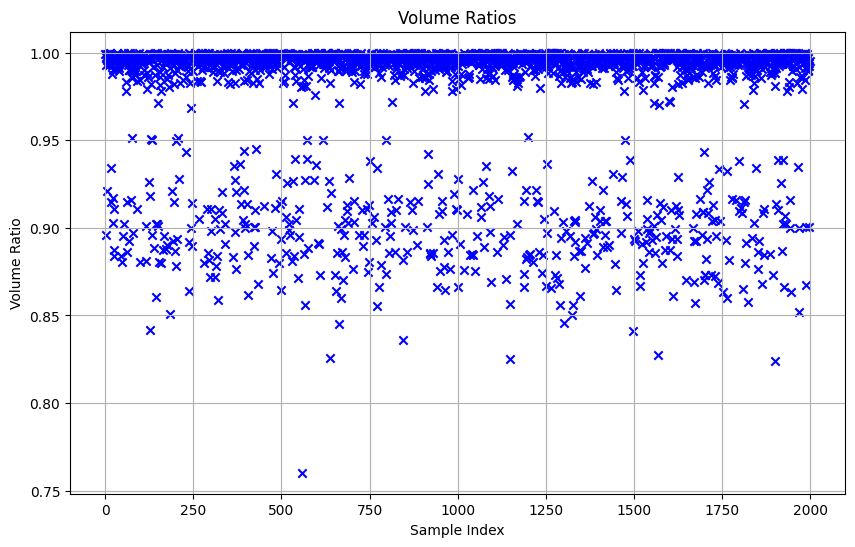

In [34]:
# Convert tensors to numpy array for plotting
vol_ratios_np = [v.item() for v in vol_ratios]
slice_ratios_np = [v.item() for v in slice]

plt.figure(figsize=(10, 6))
plt.scatter(range(len(vol_ratios_np)), vol_ratios_np, marker='x', color='b')
plt.title('Volume Ratios')
plt.xlabel('Sample Index')
plt.ylabel('Volume Ratio')
plt.grid(True)
plt.show()

In [22]:
count_less = sum(1 for v in vol_ratios_np if v < 0.91)
print(count_less, count_less / len(vol_ratios_np))

304 0.152


Lets view some generated samples and their lowest l2 norm train data points

In [8]:
base_dir = "/home/sr2369/inpainting/inference/cancer_samples"
samples = os.listdir(base_dir)

In [9]:
def load_images_from_folder(folder, regex, resize=False):
    images = []
    for filename in os.listdir(folder):
        if re.match(regex, filename):
            img = Image.open(os.path.join(folder, filename))
            if img is not None:
                if resize:
                    img = img.resize((128, 128))
                images.append(transforms.ToTensor()(img))
    return torch.from_numpy(np.array([np.array(img) for img in images]))

sample_257_1 tensor(0.9990)


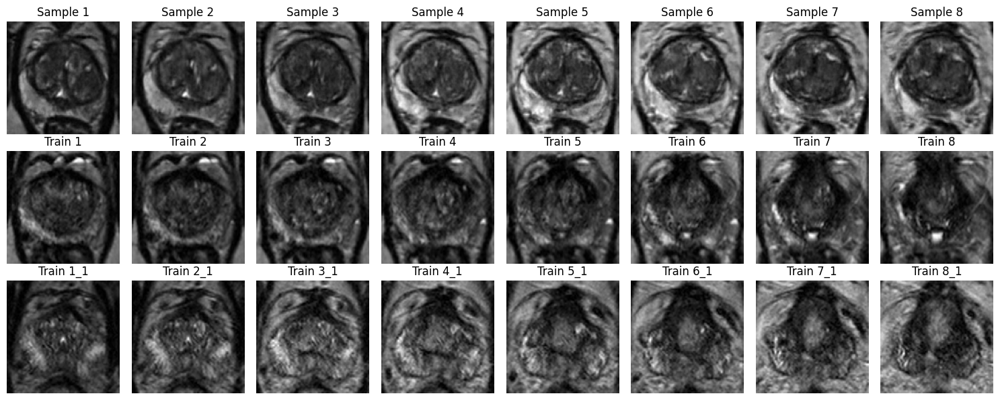

sample_12_1 tensor(0.8872)


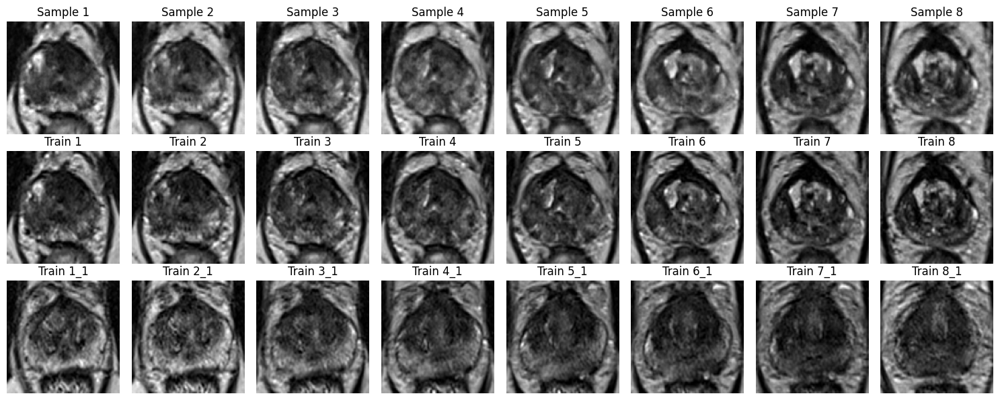

sample_23_1 tensor(0.9960)


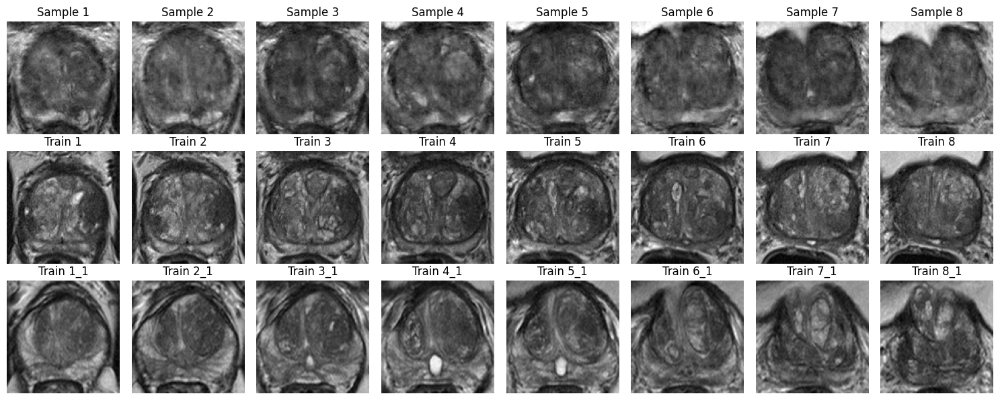

sample_695_0 tensor(0.9991)


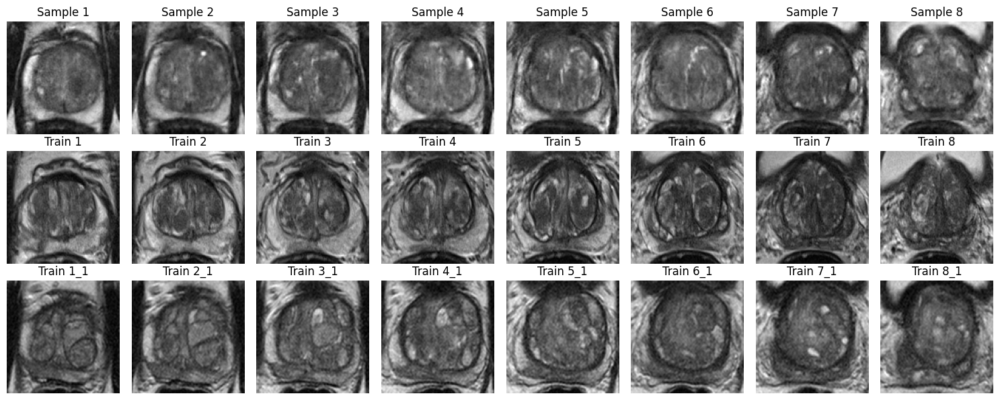

sample_364_0 tensor(0.9943)


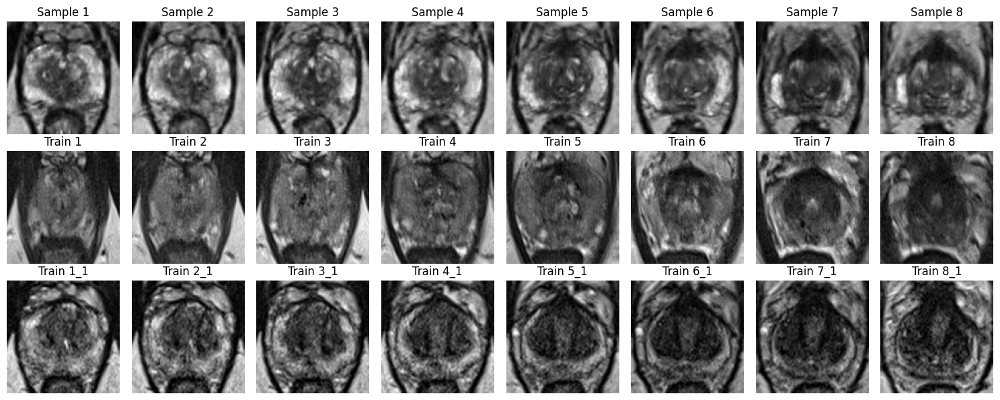

sample_368_0 tensor(0.9965)


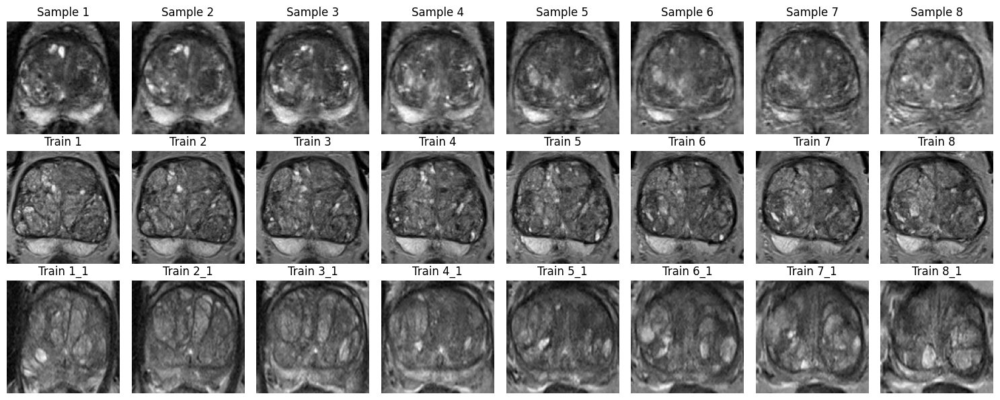

sample_172_1 tensor(0.9997)


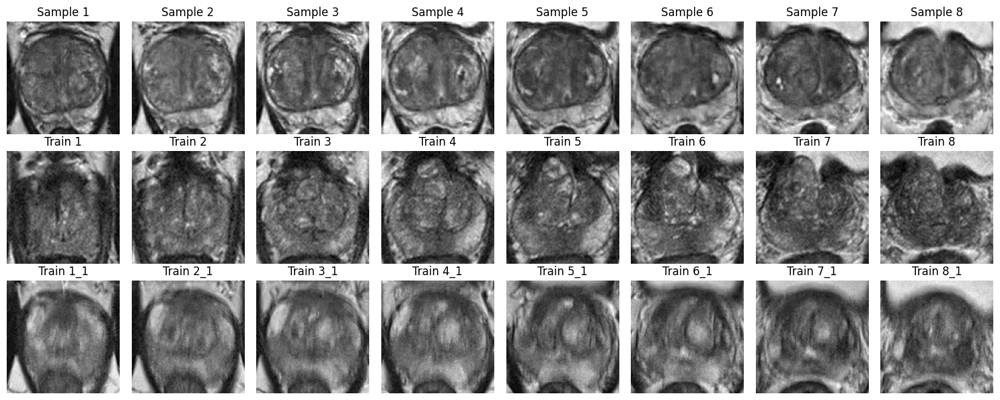

sample_129_1 tensor(0.9945)


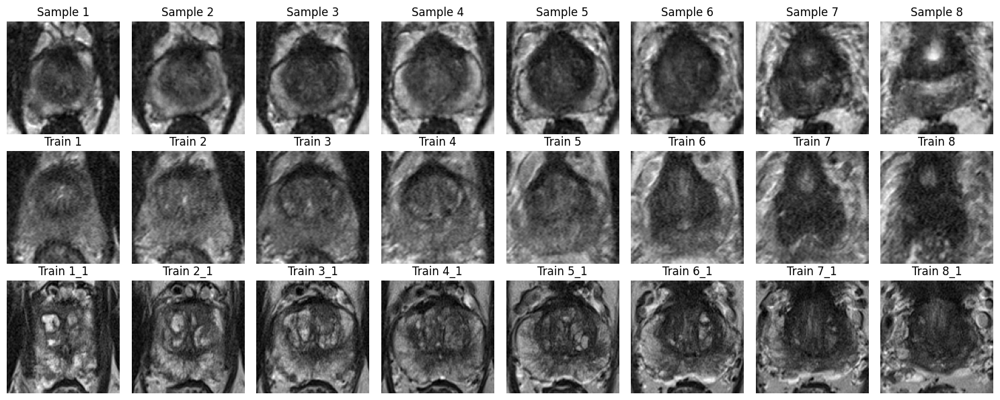

sample_401_1 tensor(0.9988)


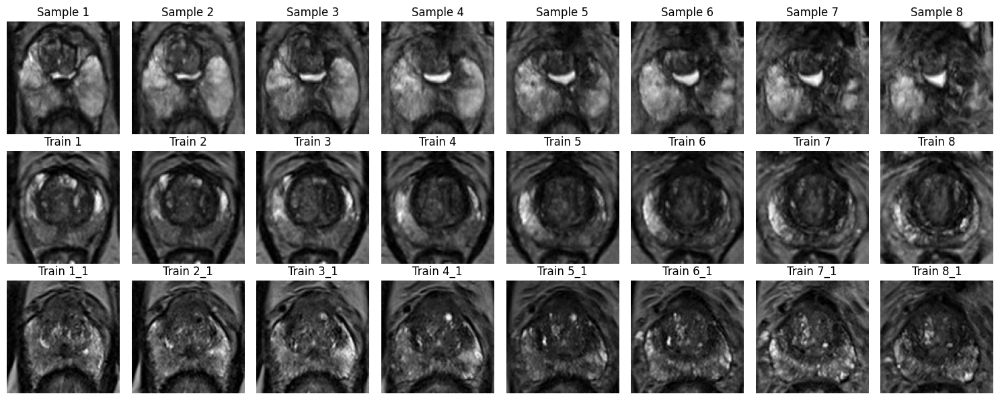

sample_278_0 tensor(0.9989)


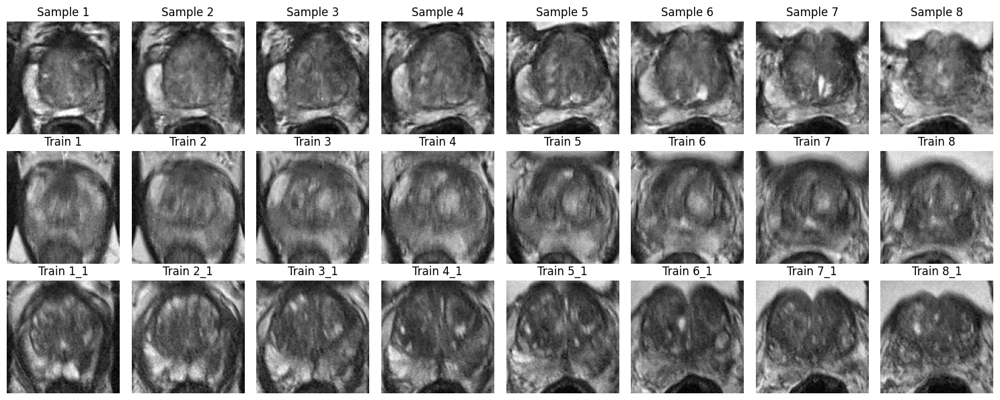

In [23]:
from pprint import pprint
import random

total_analyzed = 0

vol_ratios = []
slice = []

base_cspca_train_folder = "/home/sr2369/inpainting/max_area_3d_voxel/cspca"
regex2 = r'.*(?<!_seg)_cropped_t2\.png$'
regex1 = r'.*\.png$'

random.shuffle(samples)

for sample in samples[:10]:
    p = os.path.join(base_dir, sample, "t2")
    if os.path.exists(os.path.join(p, 'smallest_norm_t2.pkl')):
        total_analyzed += 1
        with open(os.path.join(p, 'smallest_norm_t2.pkl'), 'rb') as f:
            data = pickle.load(f)
            smallest_vol_norms = data['smallest_vol_norms']
            sm = smallest_vol_norms[0]
            sm1 = smallest_vol_norms[1]
            train_ds_folder = sm["train_data_folder"]
            train_ds_folder1 = sm1["train_data_folder"]
            
            train_ds_folder = os.path.join(base_cspca_train_folder, train_ds_folder)
            train_ds_folder1 = os.path.join(base_cspca_train_folder, train_ds_folder1)
            
            images_sample = load_images_from_folder(p, regex1)
            
            images_train = load_images_from_folder(train_ds_folder, regex2, resize=True)
            images_train_1 = load_images_from_folder(train_ds_folder1, regex2, resize=True)

            print(sample, data["vol_ratio"])
            
            fig, axes = plt.subplots(3, len(images_sample), figsize=(15, 6))

            for i, img in enumerate(images_sample):
                axes[0, i].imshow(img.permute(1, 2, 0), cmap="gray")
                axes[0, i].axis('off')
                axes[0, i].set_title(f'Sample {i+1}')

            for i, img in enumerate(images_train):
                axes[1, i].imshow(img.permute(1, 2, 0))
                axes[1, i].axis('off')
                axes[1, i].set_title(f'Train {i+1}')
                
            for i, img in enumerate(images_train_1):
                axes[2, i].imshow(img.permute(1, 2, 0))
                axes[2, i].axis('off')
                axes[2, i].set_title(f'Train {i+1}_1')

            plt.tight_layout()
            plt.show()
            

## Memorization for Non-Cancer Samples

In [5]:
base_dir = "/home/sr2369/inpainting/inference/non_cancer_samples"
samples = os.listdir(base_dir)
print(f"Found {len(samples)} samples.")

Found 2000 samples.


In [24]:
from pprint import pprint

total_analyzed = 0

vol_ratios = []
slice = []

for sample in samples:
    p = os.path.join(base_dir, sample, "t2")
    if os.path.exists(os.path.join(p, 'smallest_norm_nocspca_t2.pkl')):
        total_analyzed += 1
        with open(os.path.join(p, 'smallest_norm_nocspca_t2.pkl'), 'rb') as f:
            data = pickle.load(f)
            vol_ratios.append(data['vol_ratio'])
            slice.append(data['slice_ratio_4'])
            # for k in data:
            #     if "ratio" in k and data[k] < 0.5:
            #         print(k, data[k])
        
print(total_analyzed, len(samples))

2000 2000


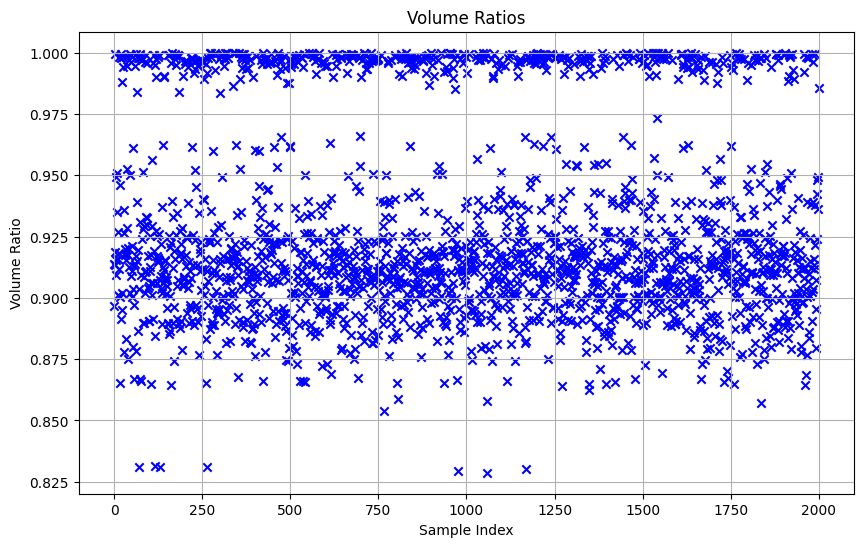

In [25]:
# Convert tensors to numpy array for plotting
vol_ratios_np = [v.item() for v in vol_ratios]
slice_ratios_np = [v.item() for v in slice]

plt.figure(figsize=(10, 6))
plt.scatter(range(len(vol_ratios_np)), vol_ratios_np, marker='x', color='b')
plt.title('Volume Ratios')
plt.xlabel('Sample Index')
plt.ylabel('Volume Ratio')
plt.grid(True)
plt.show()

In [9]:
def load_images_from_folder(folder, regex, resize=False):
    images = []
    for filename in os.listdir(folder):
        if re.match(regex, filename):
            img = Image.open(os.path.join(folder, filename))
            if img is not None:
                if resize:
                    img = img.resize((128, 128))
                images.append(transforms.ToTensor()(img))
    return torch.from_numpy(np.array([np.array(img) for img in images]))

sample_507_1 tensor(0.8966)


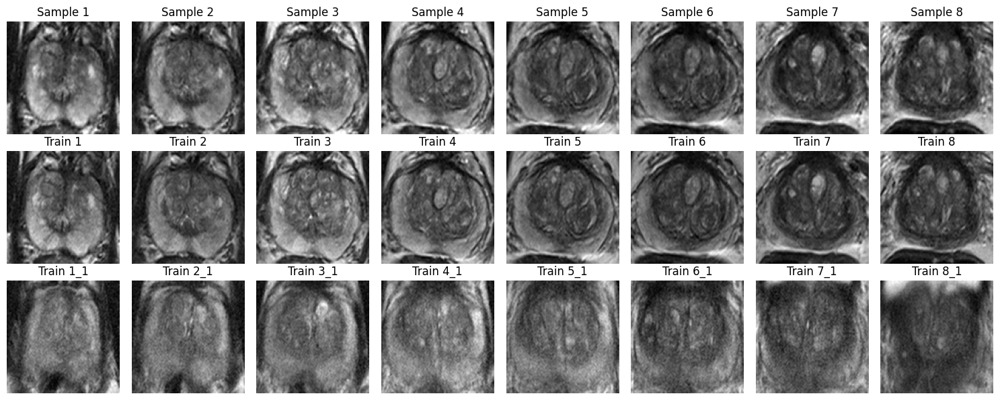

sample_195_0 tensor(0.9140)


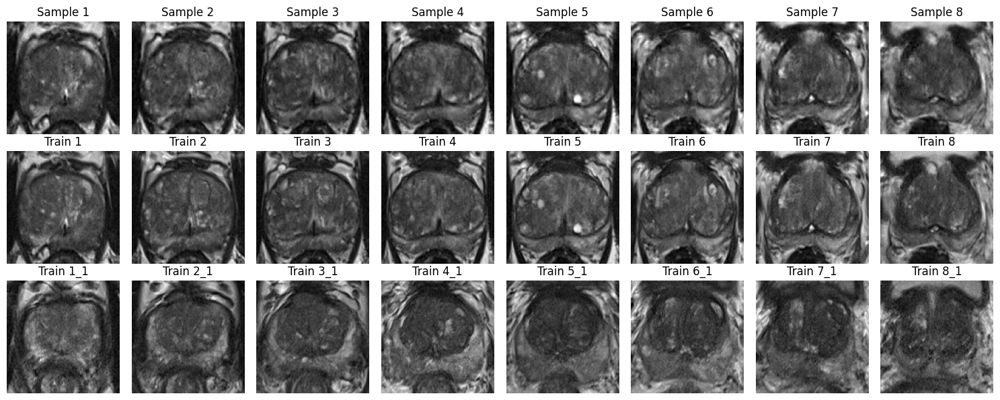

sample_346_0 tensor(0.9188)


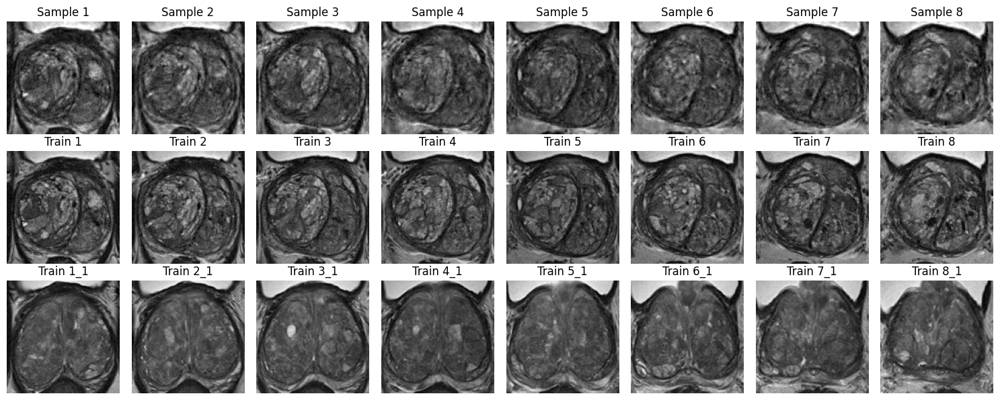

sample_184_0 tensor(0.9133)


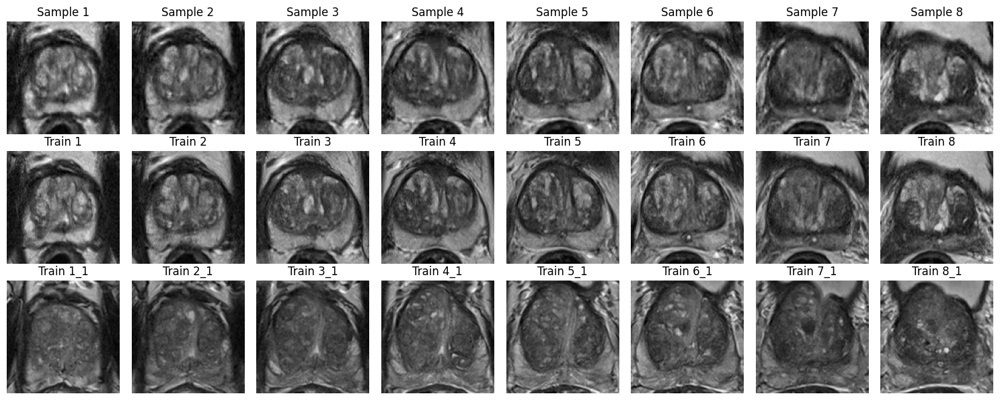

sample_462_1 tensor(0.9993)


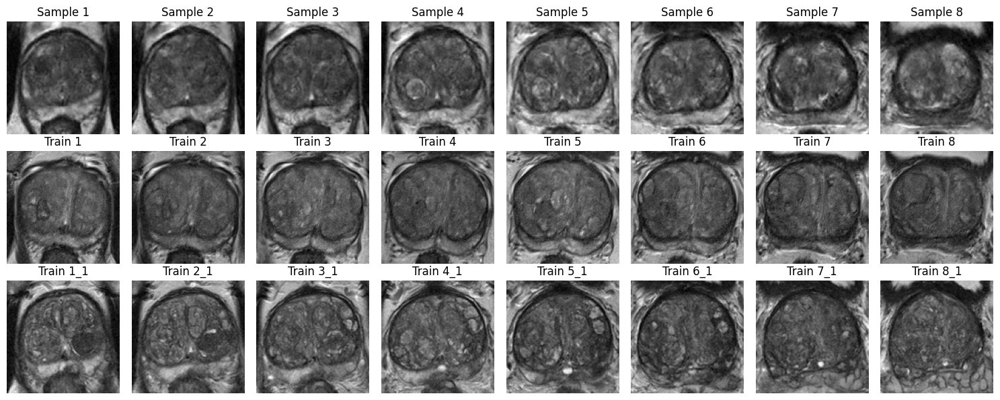

sample_679_0 tensor(0.9156)


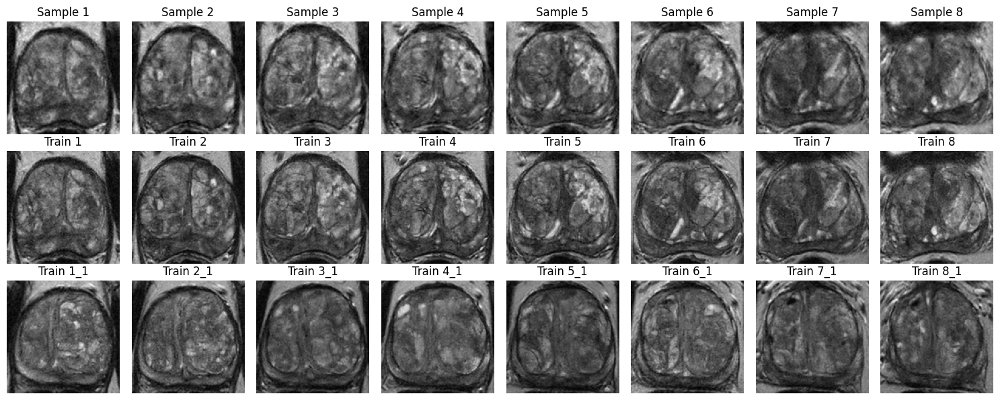

sample_580_1 tensor(0.9495)


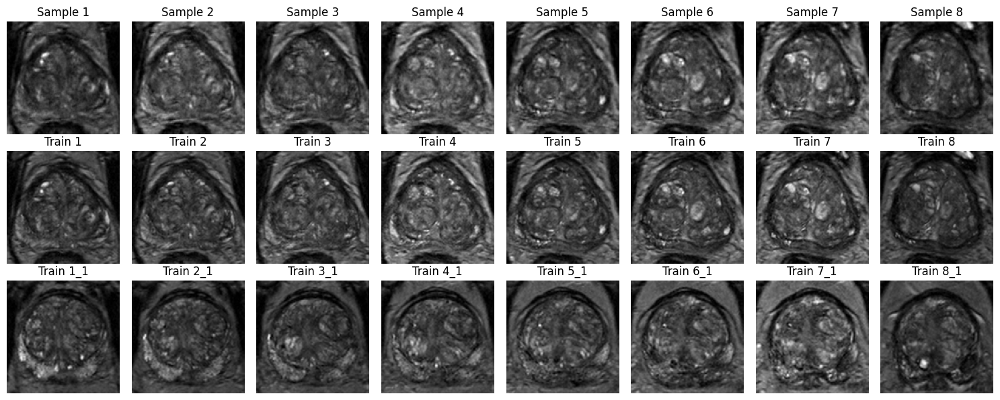

sample_581_1 tensor(0.9092)


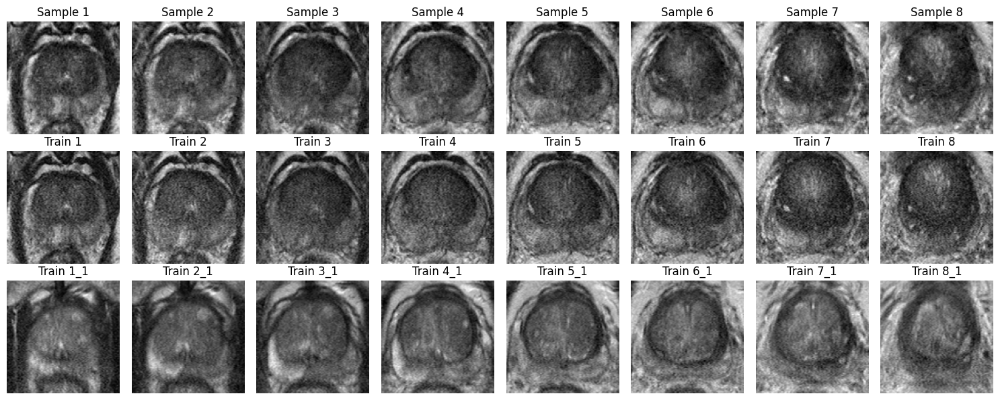

sample_80_1 tensor(0.9509)


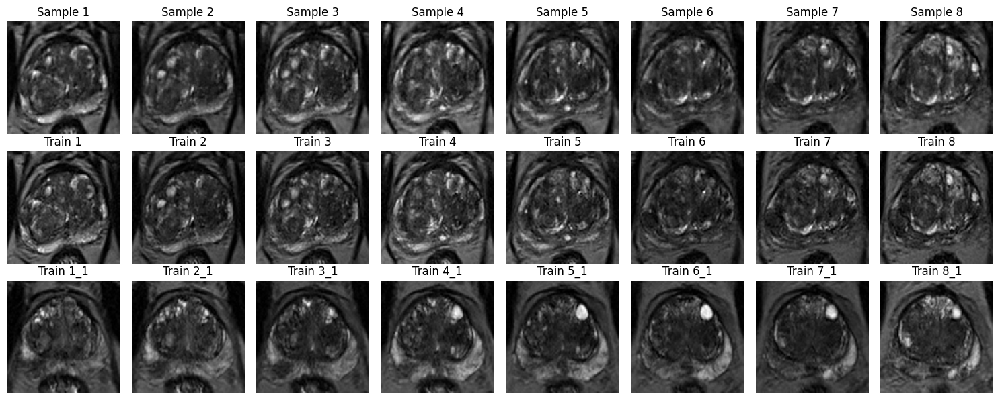

sample_124_0 tensor(0.9351)


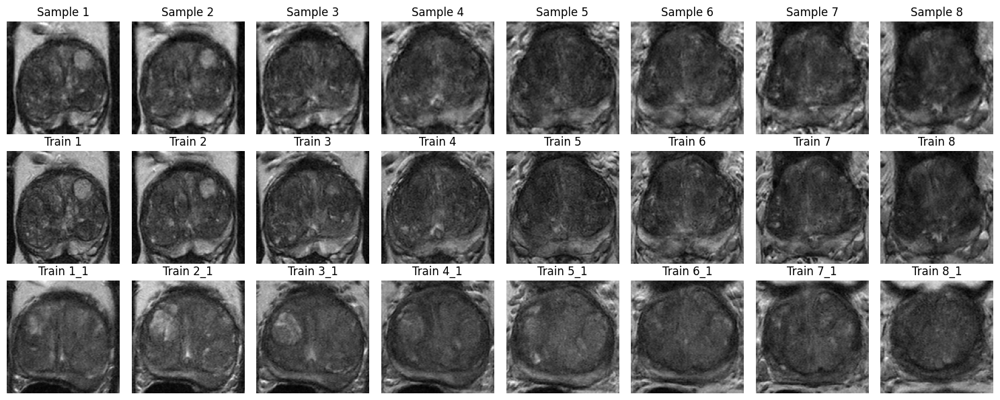

In [14]:
from pprint import pprint
import random

total_analyzed = 0

vol_ratios = []
slice = []

base_folder = "/home/sr2369/inpainting/max_area_3d_voxel/without_cspca"
regex2 = r'.*(?<!_seg)_cropped_t2\.png$'
regex1 = r'.*\.png$'

random.shuffle(samples)

for sample in samples[:10]:
    p = os.path.join(base_dir, sample, "t2")
    if os.path.exists(os.path.join(p, 'smallest_norm_nocspca_t2.pkl')):
        total_analyzed += 1
        with open(os.path.join(p, 'smallest_norm_nocspca_t2.pkl'), 'rb') as f:
            data = pickle.load(f)
            smallest_vol_norms = data['smallest_vol_norms']
            sm = smallest_vol_norms[0]
            sm1 = smallest_vol_norms[1]
            train_ds_folder = sm["train_data_folder"]
            train_ds_folder1 = sm1["train_data_folder"]
            
            train_ds_folder = os.path.join(base_folder, train_ds_folder)
            train_ds_folder1 = os.path.join(base_folder, train_ds_folder1)
            
            images_sample = load_images_from_folder(p, regex1)
            
            images_train = load_images_from_folder(train_ds_folder, regex2, resize=True)
            images_train_1 = load_images_from_folder(train_ds_folder1, regex2, resize=True)

            print(sample, data["vol_ratio"])
            
            fig, axes = plt.subplots(3, len(images_sample), figsize=(15, 6))

            for i, img in enumerate(images_sample):
                axes[0, i].imshow(img.permute(1, 2, 0), cmap="gray")
                axes[0, i].axis('off')
                axes[0, i].set_title(f'Sample {i+1}')

            for i, img in enumerate(images_train):
                axes[1, i].imshow(img.permute(1, 2, 0))
                axes[1, i].axis('off')
                axes[1, i].set_title(f'Train {i+1}')
                
            for i, img in enumerate(images_train_1):
                axes[2, i].imshow(img.permute(1, 2, 0))
                axes[2, i].axis('off')
                axes[2, i].set_title(f'Train {i+1}_1')

            plt.tight_layout()
            plt.show()
            

In [17]:
count_less = sum(1 for v in vol_ratios_np if v < 0.93)
print(count_less, count_less / len(vol_ratios_np))

1361 0.6805
